<p align = "center" draggable=”false” ><img src="https://user-images.githubusercontent.com/37101144/161836199-fdb0219d-0361-4988-bf26-48b0fad160a3.png" 
     width="200px"
     height="auto"/>
</p>

# Hate Speech Detector

Today you are a machine learning engineer, a member of the Birdwatch at Twitter. 

The objective of this task is to detect hate speech in tweets. For the sake of simplicity, a tweet contains hate speech if it has a racist or sexist sentiment associated with it. In other words, we need to classify racist or sexist tweets from other tweets.

A labelled dataset of 31,962 tweets (late 2017 to early 2018) is provided in the form of a compressed csv file with each line storing a tweet id, its label, and the tweet. Label '1' denotes the tweet is racist/sexist while label '0' denotes the tweet is not racist/sexist.

We will first approach the problem in a traditional approach: clean the raw text using simple regex (regular expression), extract features, build a naive Bayes models to classify tweets; then we build a deep learning model and explain our deep learning model with LIME.

## 📚 Learning Objectives

By the end of this lesson, you will be able to:

- Understand the basic concepts in natural language processing (NLP)
- Perform basic NLP tasks on text, e.g., tweets
- Build a naive Bayes classifier to detect hate speech 
- Build a bidirectional long short-term memory (BiLSTM) to detect hate speech
- Visualize embeddings with Tensorboard embedding projector
- Explain models with LIME

# Task I: Data Preprocessing


1. Install dependencies.

    Most modules are pre-installed in Colab, however, we need to update `gensim` to its recent version and install `lime`.

In [ ]:
!pip install -U -q gensim==4.2.0 lime

     |████████████████████████████████| 24.1 MB 2.9 MB/s 
     |████████████████████████████████| 275 kB 57.6 MB/s 


2. Connect Colab to your local Google Drive.

In [40]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


3. Use `pandas.read_csv` to load the tweets in `tweets.csv.gz` and save the `pd.DataFrame` into `raw`. Make sure the path points to where the data is located in your Google Drive. 

In [44]:
import pandas as pd
raw = pd.read_csv('/content/drive/MyDrive/tweets.csv.gz')

In [45]:
print(raw.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31962 entries, 0 to 31961
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      31962 non-null  int64 
 1   label   31962 non-null  int64 
 2   tweet   31962 non-null  object
dtypes: int64(2), object(1)
memory usage: 749.2+ KB
None


4. Sample 5 random tweets from the dataset for each label and display `label` and `tweet` columns. 
Hint: one option is to use `sample()` followed by `groupby`. 

In [49]:
# Colab includes an extension that renders pandas dataframes into interactive displays that can be filtered, sorted, and explored dynamically.
from google.colab import data_table
data_table.enable_dataframe_formatter() 

raw.sample(5).groupby(['label']).apply(display)

,id,label,tweet
5391,5392,0,"bluff oysters, bubbly and rugby - strange comb..."
28458,28459,0,track action stas todayðð»#lemans24
26918,26919,0,i am in full design mode! #nowplaying i'm to...
4660,4661,0,#orlando more love is need in this world tod...
21806,21807,0,gee those look like empty seats to me at a @us...


""


5. The tweets are in English and all words should be already in lowercase. 
Now calculate the number of characters in each tweet and assign the values to a new column `len_tweet` in `raw`. 

In [50]:
raw['len_tweet'] = raw['tweet'].apply(lambda x: len(x))

6. What are the summary statistics of `len_tweet` for each label? 
Hint: use `groupby` and `describe`. 

In [53]:
pd.set_option("display.precision", 1)

raw.groupby(['label']).describe()

id                                                            \
         count     mean     std   min     25%      50%      75%      max   
label                                                                      
0      29720.0  15974.5  9223.8   1.0  7981.8  15971.5  23965.2  31962.0   
1       2242.0  16074.9  9268.0  14.0  8075.2  16095.0  24022.0  31961.0   

      len_tweet                                              
          count  mean   std   min   25%   50%    75%    max  
label                                                        
0       29720.0  84.3  29.6  11.0  62.0  88.0  107.0  274.0  
1        2242.0  90.2  27.4  12.0  69.0  96.0  111.0  152.0

Note we have an imbalanced dataset: the ratio of non-hate speech to hate speech is roughly 13:1. 

7. Clean the tweets. 

    We use `re` to perform basic text manipulations. 
    Specically, remove anonymized user handle, remove numbers and special characters except hashtags.

In [54]:
import re

8. Remove user handles from the text in `tweet`, or anything directly following the symbols `@`, and save the resulting tweets to a new column `tidy_tweet` in `raw`. 
    
    Hint: you can use `re.sub` on individual text and [`apply`](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.apply.html) a simple lambda function for the series `raw['tweet']`.

In [94]:
raw['tidy_tweet'] = raw['tweet'].apply(lambda x: re.sub('@user', '', x))
raw.sample(5, random_state=203)

,id,label,tweet,len_tweet,tidy_tweet
790,791,1,@user and you keep telling that only aryans ar...,109,and you keep telling that only aryans are all...
21928,21929,0,@user what makes you ?,25,what makes you ?
25642,25643,0,"â #nzd/usd extends rbnz-led rally, hits fre...",101,"â #nzd/usd extends rbnz-led rally, hits fre..."
20436,20437,0,i'm on a mission to ride all of the animals! ...,91,i'm on a mission to ride all of the animals! ...
22552,22553,0,the color of a human skin matters a lot to the...,88,the color of a human skin matters a lot to the...


9. Remove non-alphabetic characters yet keep symbols `#` from `tidy_tweet` and save the result in `tidy_tweet`. 
In other words, keep all 26 letters and `#`.

    Note: in some applications, punctuations, emojis, or whether the word is in all caps can be of use. 
    You shall decide whether to extract such features for the application and perform error analysis to gain insight. 

In [95]:
raw['tidy_tweet'] = raw['tidy_tweet'].apply(lambda x: re.sub(r'[,\.!?\/\'-]', ' ', x).encode("ascii", errors="ignore").decode())
raw.sample(5, random_state=203)

,id,label,tweet,len_tweet,tidy_tweet
790,791,1,@user and you keep telling that only aryans ar...,109,and you keep telling that only aryans are all...
21928,21929,0,@user what makes you ?,25,what makes you
25642,25643,0,"â #nzd/usd extends rbnz-led rally, hits fre...",101,#nzd usd extends rbnz led rally hits fresh ...
20436,20437,0,i'm on a mission to ride all of the animals! ...,91,i m on a mission to ride all of the animals ...
22552,22553,0,the color of a human skin matters a lot to the...,88,the color of a human skin matters a lot to the...


10. Remove words that is shorter than 4 characters from the processed tweets.

    For example, 
      
    `i m on a mission to ride all of the animals #teamchanlv #vegas #lasvegas #funtimes`
      
    will be reduced to 
      
    `mission ride animals #teamchanlv #vegas #lasvegas #funtimes`


In [96]:
raw['tidy_tweet'] = raw['tidy_tweet'].apply(lambda x: ' '.join([w for w in x.split() if len(w) > 4]))
raw.sample(5, random_state=203)

,id,label,tweet,len_tweet,tidy_tweet
790,791,1,@user and you keep telling that only aryans ar...,109,telling aryans allowed women troll
21928,21929,0,@user what makes you ?,25,makes
25642,25643,0,"â #nzd/usd extends rbnz-led rally, hits fre...",101,extends rally fresh #blog #silver #gold #forex
20436,20437,0,i'm on a mission to ride all of the animals! ...,91,mission animals #teamchanlv #vegas #lasvegas #...
22552,22553,0,the color of a human skin matters a lot to the...,88,color human matters system comes judgement


11. Remove stopwords and perform text normalization. 
    
    We will use `stopwords` collection and `SnowballStemmer` in `nltk` for this task. Before doing so, we need to tokenize the tweets. 
    Tokens are individual terms or words, and tokenization is simply to split a string of text into tokens. 
    You can use [`str.split()`](https://docs.python.org/3/library/stdtypes.html#str.split) on individual text and [`apply`](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.apply.html) a simple lambda function for the series `raw['tidy_tweet']` and save the result into `tokenized_tweet`. 
    
    Check out some methods for the built-in type `str` [here](https://docs.python.org/3/library/stdtypes.html#string-methods).

In [97]:
tokenized_tweet = raw['tidy_tweet'].apply(lambda x: x.split())
tokenized_tweet.head()

0    [father, dysfunctional, selfish, drags, dysfun...
1    [thanks, #lyft, credit, cause, offer, wheelcha...
2                                    [bihday, majesty]
3                                             [#model]
4                  [factsguide:, society, #motivation]
Name: tidy_tweet, dtype: object

12. Extract stop words and remove them from the tokens.

    Note: depending on the task / industry, it is highly recommended that one curate custom stop words. 

In [98]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
stop_words = stopwords.words('english')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [99]:
tokenized_tweet = tokenized_tweet.apply(lambda x: [w for w in x if w not in stop_words])

In [100]:
assert any(word in tokenized_tweet for word in stop_words) == False

13. Create a new instance of a language specific [`SnowballStemmer`](https://www.nltk.org/api/nltk.stem.snowball.html), set the `language` to be "english"; see [how to](https://www.nltk.org/howto/stem.html). 

In [102]:
from nltk.stem.snowball import SnowballStemmer
stemmer = SnowballStemmer(language='english')

In [103]:
tokenized_tweet = tokenized_tweet.apply(lambda x: [stemmer.stem(i) for i in x]) 
tokenized_tweet.head()

0          [father, dysfunct, selfish, drag, dysfunct]
1    [thank, #lyft, credit, caus, offer, wheelchair...
2                                    [bihday, majesti]
3                                             [#model]
4                       [factsguide:, societi, #motiv]
Name: tidy_tweet, dtype: object

14. Lastly, let's stitch these tokens in `tokenized_tweet` back together and save them in `raw['tidy_tweet']`. 
Use [`str.join()`](https://docs.python.org/3/library/stdtypes.html#str.join) and `apply`.

In [104]:
raw['tidy_tweet'] = tokenized_tweet.apply(lambda x: ' '.join(x))

# Task 2. Wordcloud and Hashtag

In this task, we want to gain a general idea of what the common words were and how hashtags were used in tweets. 
We will create wordclouds and extract the top hashtags used in each label. 

1. Before doing so, out of caution of possible data leakage, split the `raw['tidy_tweet']` into training and test datasets in a stratified fashion, set the test size at .25 and random state as 42.
    
    Save the results into `X_train`, `X_test`, `y_train`, and `y_test`.

In [105]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    raw['tidy_tweet'], raw.label, 
    test_size=0.25, random_state=42, stratify=raw.label)

In [106]:
assert X_train.shape == y_train.shape == (23971, )
assert X_test.shape == y_test.shape == (7991,)

2. A word cloud is a cluster of words depicted in different sizes. 
The bigger the word appears, the more often it appears in the given text. 
It can offer an easy visual presentation to reveal the theme of a topic. 

    Function `plot_wordcloud` is provided to plot 50 most frequent words from the given text in the shape of twitter's logo. 
    You may need to replace the image path accordingly.

In [111]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

def plot_wordcloud(text:str) -> None:
    '''
    Plot a wordcloud of top 50 words from the input text
    masked by twitter logo
    '''
    mask = np.array(Image.open('/content/drive/My Drive/twitter-mask.png')) # REPLACE w/ YOUR FILE PATH
    wordcloud = WordCloud( 
        background_color='white', 
        random_state=42,
        max_words=50, 
        max_font_size=80, 
        mask = mask).generate(text)
    plt.figure(figsize=(10,10))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

In [108]:
X_train.head()

1036          spread peanut butter white bread #littlewond
2380       watch america simpson 30for30 interest still go
31605                franci underwood leav marseill #nojok
23437         #enjoy #music #today #free #app #free #music
2669     #juic experi #notsobad #healthyliv #eatclean #...
Name: tidy_tweet, dtype: object

3. Visualize the wordcloud. 

    The function expects one long string. 
    Stitch all tidy tweets from training set and save the single string to `all_words`, then visualize the wordcloud for all the words.

In [109]:
all_words = ' '.join(X_train)

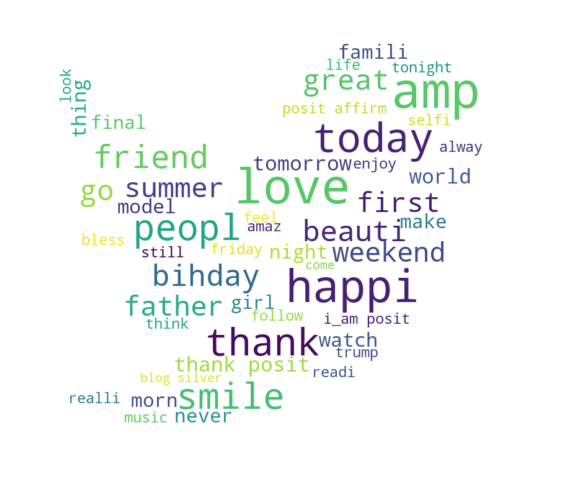

In [112]:
plot_wordcloud(all_words)

In [114]:
y_train.unique()

array([0, 1])

4. Visualize the wordcloud just for the text from the tweets identified as hate speech. 

    Similarly, you need to stitch all the tidy tweets in training set that were identified as hate speech. 
    Save the long string to `negative_words`.

In [115]:
negative_words = ' '.join(X_train[y_train==1])

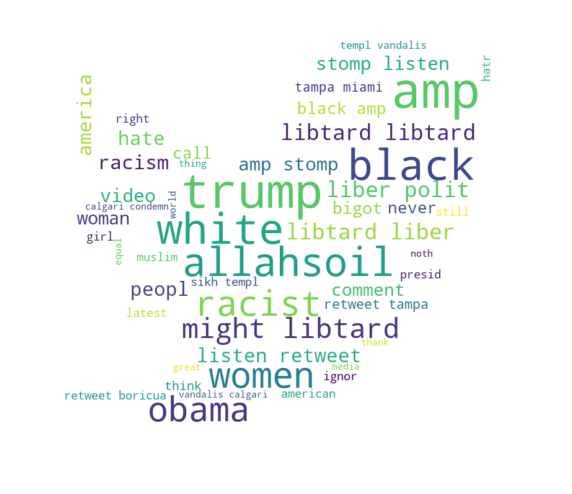

In [116]:
plot_wordcloud(negative_words)

5. Hashtag is a feature for tweets and we would like to inspect if hashtags provide information for our classification task. 

    Function `hashtag_extract` is provided to extract hastags from an iterable (list or series) and return the hashtags in a list. 

In [117]:
def hashtag_extract(x) -> list:
    """
    extract hastags from an iterable (list or series) and 
    return the hashtags in a list.
    """
    hashtags = []
    # Loop over the words in the tweet
    for i in x:
        ht = re.findall(r"#(\w+)", i)
        hashtags.append(ht)
    return hashtags

6. Extract hashtags from non-hate speech tweets.

In [118]:
HT_regular = hashtag_extract(X_train[y_train==0])

In [119]:
assert type(HT_regular) == list
assert type(HT_regular[0]) == list # nested list

7. Now extract hashtags from hate speech tweets.

In [120]:
HT_negative = hashtag_extract(X_train[y_train==1])

8. Both `HT_regular` and `HT_negative` are nested lists, so use the following trick to unnest both lists.

In [121]:
HT_regular = sum(HT_regular,[])
HT_negative = sum(HT_negative,[])

In [122]:
assert type(HT_regular) == type(HT_negative) == list
assert type(HT_regular[0]) == type(HT_negative[0]) == str

9. Complete the function `top_hashtags` below to take a list of hashtags and return the top `n` hashtag keyword and its frequncy. 

In [123]:
from typing import List, Tuple
from collections import Counter
def top_hashtags(hashtags:List[str], n=10) -> List[Tuple[str, int]]:
    ''' Function to return the top n hashtags '''
    counter = Counter(hashtags)
    return counter.most_common(n)

1. Apply the function to the hashtag lists from the non-hate speech tweets and the hate speech tweets.

In [127]:
top_hashtags(HT_regular)

[('love', 1239),
 ('posit', 693),
 ('smile', 514),
 ('healthi', 423),
 ('thank', 398),
 ('life', 328),
 ('affirm', 323),
 ('model', 284),
 ('summer', 279),
 ('beauti', 273)]

In [128]:
top_hashtags(HT_negative)

[('trump', 97),
 ('allahsoil', 77),
 ('polit', 73),
 ('liber', 61),
 ('libtard', 57),
 ('retweet', 50),
 ('miami', 37),
 ('black', 36),
 ('hate', 28),
 ('bigot', 27)]

10. DISCUSS: are these hashtags making sense? should we include them as features or should we strip the # before tokenizing (that is, treat "#love" the same as "love")? why and why not?
          It really depends on the context. The hashtags alone don't really give an indication of what is considered hate speech but rather how the hashtag is assigned to the tweet as a whole. It doesn't make sense to just take the words 'black' and 'allah' as hate speech when we don't know the full context.

# Task 3. Features

Note that almost all the machine learning related Python modules expect numerical presentation of data; thus we need to transform our text first.
We will experiment with bag of words, tf-idf, and word2vec.  

1. Convert the collection of text documents to a matrix of token counts.

    Check the [official documentation](https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html). 
    
    Create an instance of `CountVectorizer` named `bow_vectorizer`, set `max_features` to be `MAX_FEATURES`.
    Learn the vocabulary dictionary and return document-term matrix and save it to `bow_train`. Use `.fit_transform`. 

In [129]:
from sklearn.feature_extraction.text import CountVectorizer
MAX_FEATURES = 1000


bow_vectorizer = CountVectorizer(max_features=MAX_FEATURES)
bow_train = bow_vectorizer.fit_transform(X_train)

In [130]:
assert bow_train.shape == (X_train.shape[0], MAX_FEATURES)

2. Print the first three rows from `bow_train`. Hint: `.toarray()`.

In [131]:
bow_train.toarray()[:3]

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [132]:
from scipy.sparse.csr import csr_matrix
assert type(bow_train) == csr_matrix

3. Similarly, convert the collection of text documents to a matrix of TF-IDF features.
    
    Create an instance of [`TfidfVectorizer`](https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html#sklearn.feature_extraction.text.TfidfVectorizer) named `tfidf_vectorizer`, set `max_features` to be `MAX_FEATURES`.

    Learn the vocabulary and idf, return document-term matrix and save it to `tfidf_train`. 

In [133]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [134]:
tfidf_vectorizer = TfidfVectorizer(max_features=MAX_FEATURES, stop_words='english')  # YOUR CODE HERE
tfidf_train = tfidf_vectorizer.fit_transform(X_train)

In [135]:
assert type(tfidf_train) == csr_matrix
assert tfidf_train.shape == bow_train.shape == (X_train.shape[0], MAX_FEATURES)

4. Extract word embeddings using Word2Vec. 
We will use [`gensim`](https://radimrehurek.com/gensim/auto_examples/tutorials/run_word2vec.html) for this task. 
    
    The Word2Vec model takes either a list of lists of tokens or an iterable that streams the sentences directly from disk/network. 
    Here, we tokenize the tidy tweets in `X_train` and save the list (`pd.series`) of lists of tokens to `tokenized_tweet`. 

In [136]:
X_train.head()

1036          spread peanut butter white bread #littlewond
2380       watch america simpson 30for30 interest still go
31605                franci underwood leav marseill #nojok
23437         #enjoy #music #today #free #app #free #music
2669     #juic experi #notsobad #healthyliv #eatclean #...
Name: tidy_tweet, dtype: object

In [137]:
tokenized_tweet = X_train.apply(lambda x: x.split())

In [138]:
assert tokenized_tweet.shape == X_train.shape

In [139]:
tokenized_tweet.head()

1036     [spread, peanut, butter, white, bread, #little...
2380     [watch, america, simpson, 30for30, interest, s...
31605          [franci, underwood, leav, marseill, #nojok]
23437    [#enjoy, #music, #today, #free, #app, #free, #...
2669     [#juic, experi, #notsobad, #healthyliv, #eatcl...
Name: tidy_tweet, dtype: object

5. Import `Word2Vec` from `gensim.models`; see [doc](https://radimrehurek.com/gensim/models/word2vec.html#gensim.models.word2vec.Word2Vec). 

    Create a skip-gram `Word2Vec` instance named `w2v` that learns on the `tokenized_tweet`, with `vector_size` set at `MAX_FEATURES`, and other parameters are provided. 

In [140]:
from gensim.models import Word2Vec

In [141]:
w2v = Word2Vec(
        tokenized_tweet,
        vector_size = MAX_FEATURES,
        window=5, min_count=2, sg = 1, 
        hs = 0, negative = 10,  workers= 2, 
        seed = 34)

6. Train the skip-gram model, set the epochs at 20.

In [143]:
%%time
w2v.train(tokenized_tweet, total_examples=w2v.corpus_count, epochs=20)

CPU times: user 1min 2s, sys: 56.6 ms, total: 1min 2s
Wall time: 37.9 s


(2097839, 2585440)

7. Let's see how the model performs. 
Specify a word and print out the 10 most similar words from the our tweets in the training set. 
Use [`most_similar`](https://radimrehurek.com/gensim/models/keyedvectors.html#gensim.models.keyedvectors.KeyedVectors.most_similar). 
Hint: print the type of `w2v` and `w2v.wv`.

In [146]:
w2v.wv.most_similar('black', topn=10)

[('#nigger', 0.674227237701416),
 ('obstruct', 0.6428146362304688),
 ('others)', 0.6423611640930176),
 ('page3', 0.6388102173805237),
 ('stockholm', 0.6323102116584778),
 ('uyanze:', 0.6304822564125061),
 ('professor', 0.6284634470939636),
 ('blowjob', 0.6247806549072266),
 ('waiter', 0.6236767768859863),
 ('sexest', 0.621187150478363)]

8. Discuss: how does w2v calculate the similarities? 

  Cosine similarity, we calculate the euclidean distance between the vectorizations of words.

9. Discuss: do you think Word2Vec is supervised or unsupervised ML technique?

   Generally unsupervised because it doesn't need any training labels to understand relationships between words when generating embeddings but some call it self-supervised because it does contain some supervised ML traits as it uses a neural network that backpropagates errors to correct itself when learning word embeddings.

10. Engineer features. 

    For each tweet, we calculate the average of embeddings (function `word_vector`) and then apply it to every tidy tweet in `X_train` (use function `tokens_to_array`).
    Both functions are provided, inspect the code and save the features in `w2v_train`.

In [147]:
from gensim.models.keyedvectors import KeyedVectors

def word_vector(tokens:list, size:int, keyed_vec:KeyedVectors= w2v.wv):
    vec = np.zeros(size).reshape((1, size))
    count = 0
    for word in tokens:
        try:
            vec += keyed_vec[word].reshape((1, size))
            count += 1
        except KeyError: 
            # handling the case where the token is not in vocabulary        
            continue
    if count != 0:
        vec /= count
    return vec

def tokens_to_array(tokens:list, size:int, keyed_vec:KeyedVectors= w2v.wv):
    array = np.zeros((len(tokens), size))
    for i in range(len(tokens)):
        array[i,:] = word_vector(tokens.iloc[i], size, keyed_vec=keyed_vec)
    return array

In [156]:
w2v_train = tokens_to_array(X_train.apply(lambda x: x.split()), size=MAX_FEATURES)

In [157]:
assert w2v_train.shape == (X_train.shape[0], MAX_FEATURES)

11. Prepare the test data before modeling for each approach:


  - extract features from `X_test` using the bag of words approach; use `bow_vectorizer`
  - extract features from `X_test` using the tf-idf approach; use `tfidf_vectorizer`
  - extract features from `X_test` using Word2Vec embeddings; you need to first tokenized the tidy tweets in `X_test`, then convert the tokens to array of shape `(X_test.shape[0], MAX_FEATURES)`.

In [159]:
bow_test = bow_vectorizer.fit_transform(X_test)
tfidf_test = tfidf_vectorizer.fit_transform(X_test)

tokenized_tweet_test = X_test.apply(lambda x: x.split())
w2v_test = tokens_to_array(tokenized_tweet_test, size=MAX_FEATURES)

In [160]:
assert bow_test.shape == tfidf_test.shape == w2v_test.shape == (X_test.shape[0], MAX_FEATURES)

# Task 4. Naive Bayes classifiers

In this task, you will build a [naive Bayes](https://sebastianraschka.com/Articles/2014_naive_bayes_1.html) (here's another [ref](https://www.inf.ed.ac.uk/teaching/courses/inf2b/learnnotes/inf2b-learn07-notes-nup.pdf)), classifiers to identify the hate speech tweets using different sets of features from the last task, and evaluate their performances. 

In the era of deep learning, naive Bayes is useful due to its simplicity and reasonable performance, especially if there is not much training data available. A common interview question is "Why is naive Bayes naive?". 

We will use multi-variate Bernoulli naive Bayes [`BernoulliNB`](https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.BernoulliNB.html); try other flavors of [naive Bayes](https://scikit-learn.org/stable/modules/classes.html#module-sklearn.naive_bayes) if time permits. Code is pretty straightforward. 

1. Import `BernoulliNB` for modeling and `classification_report` for reporting performance. 

In [161]:
from sklearn.naive_bayes import BernoulliNB
from sklearn.metrics import classification_report

2. Create an instance of  `BernoulliNB` named `BNBmodel`. 

    We can use it for all three feature sets.

In [162]:
BNBmodel = BernoulliNB()

3. Train the multi-variate Bernoulli naive Bayes using bag of words features and print the performance report.

In [163]:
BNBmodel.fit(bow_train, y_train)

BernoulliNB()

In [167]:
print(classification_report(y_test, BNBmodel.predict(bow_test)))

              precision    recall  f1-score   support

           0       0.93      0.94      0.93      7430
           1       0.06      0.05      0.05       561

    accuracy                           0.87      7991
   macro avg       0.49      0.49      0.49      7991
weighted avg       0.87      0.87      0.87      7991



4. Similarly, train the model using tf-idf features and print the performance report. 

    Is the performance expected? Why or why not?

In [168]:
BNBmodel.fit(tfidf_train, y_train)

BernoulliNB()

In [169]:
print(classification_report(y_test, BNBmodel.predict(tfidf_test)))

              precision    recall  f1-score   support

           0       0.93      0.95      0.94      7430
           1       0.08      0.06      0.07       561

    accuracy                           0.89      7991
   macro avg       0.51      0.50      0.50      7991
weighted avg       0.87      0.89      0.88      7991



5. Finally, train the model using Word2Vec embeddings and report the performance. 

In [170]:
BNBmodel.fit(w2v_train, y_train)
print(classification_report(y_test, BNBmodel.predict(w2v_test)))

              precision    recall  f1-score   support

           0       0.99      0.83      0.90      7430
           1       0.27      0.84      0.41       561

    accuracy                           0.83      7991
   macro avg       0.63      0.84      0.66      7991
weighted avg       0.94      0.83      0.87      7991



6. Discuss the differences in performace using tf-idf vs skim-gram embeddings. 

    TFIDF has higher recall for non-hate speech whereas skip-gram has better recall for hate-speech. Skip-gram is better at classifying hate-speech and very precise at classifying non-hate speech. Overall skip-gram is better.

In [172]:
X_test[(y_test == 0) & (BNBmodel.predict(w2v_test)==1)]

21614          address argument rather #troll #staup #rude
31522    world turn polit zoolog disast govern truli learn
2100     cannot imagin shoe local enforc first respond ...
17364      #rahul forcibl ask #punjabi admit #drugaddicts:
31771       watch footbal player cross countri #highschool
                               ...                        
9339     mrrat395: #starfightersaturday phantomavi cptp...
27934    threat america #bigotri #misogyni #ignor #alwa...
17220    amount general happen attack peopl toler peopl...
24452       login broker #chang #meme #love #educ #univers
6156                 #punjab noth #udtapunjab vineet joshi
Name: tidy_tweet, Length: 1251, dtype: object

7. Examine a few tweets where the model(s) failed. 
What other features would you include in the next iteration?

    Looked at the False Positives and I noticed that there were a lot of topics that sound like hate speech like 'rude', 'troll', 'drugaddicts' are not necessarily hate speech. I would try to include more training samples of these kinds of tweets into the data set.

# Task 5. Bidirectional LSTM 

In this task, you will build a bidirectional LSTM (BiLSTM) model to detect tweets identified as hate speech, and visualize the embedding layer using Tensorboard projector. 

Why BiLSTM? LSTM, at its core, preserves information from inputs that has already passed through it using the hidden state. Unidirectional LSTM only preserves information of the past because the only inputs it has seen are from the past. BiLSTMs run inputs in both ways, one from past to future and one from future to past and show very good results as they can understand context better [ref](https://stackoverflow.com/questions/43035827/whats-the-difference-between-a-bidirectional-lstm-and-an-lstm).

1. Tokenizing and padding. 
    
    As LSTM expects every sentence to be of the same length, in addition to [`Tokenizer`](https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/text/Tokenizer) with a given number of vocabulary `VOCAB_SIZE`, we need to [pad](https://www.tensorflow.org/api_docs/python/tf/keras/utils/pad_sequences) shorter tweets with 0s until the length is `MAX_LEN` and truncate longer tweets to be exact `MAX_LEN` long. 
    
   Function `tokenize_pad_sequences` is provided except that you need to supply correct `num_words` and `filters`; do NOT filter `#`. 
   
   We feed the processed `tidy_tweet` to `tokenize_pad_sequences`, but one can perform the preprocessing steps in `Tokenizer` and apply it directly on the raw tweets.

In [173]:
VOCAB_SIZE = 25000  
MAX_LEN = 50

In [175]:
import tensorflow as tf
from tensorflow import keras

from keras.preprocessing.text import Tokenizer
from keras_preprocessing.sequence import pad_sequences

def tokenize_pad_sequences(text):
    '''
    tokenize the input text into sequences of integers and then
    pad each sequence to the same length
    '''
    # Text tokenization
    tokenizer = Tokenizer(
        num_words=VOCAB_SIZE,
        filters=r'^[a-zA-Z0-9# ]*',
        lower=True, split=' ', oov_token='oov')
    tokenizer.fit_on_texts(text)
    # Transforms text to a sequence of integers
    X = tokenizer.texts_to_sequences(text)
    # Pad sequences to the same length
    X = pad_sequences(X, padding='post', maxlen=MAX_LEN)

    return X, tokenizer

In [176]:
print('Before Tokenization & Padding \n', raw['tidy_tweet'][0])
X, tokenizer = tokenize_pad_sequences(raw['tidy_tweet'])
print('After Tokenization & Padding \n', X[0])
y = raw['label'].values

Before Tokenization & Padding 
 father dysfunct selfish drag dysfunct
After Tokenization & Padding 
 [   6   28 4245 1864  200   22 4245    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0]


2. Let's split `X` into training and testing datasets, save 25% for testing. 
Then split training dataset into training and validation datasets, with 20% for validation. 
Set both `random_state` to be 42. 
Stratify both splits. 

In [177]:
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.25,
    random_state=42,
    stratify=y
    )
X_train, X_val, y_train, y_val = train_test_split(
    X_train,
    y_train,
    test_size=0.20,
    random_state=42,
    stratify=y_train
    )

In [178]:
print('Train Set ->', X_train.shape, y_train.shape)
print('Validation Set ->', X_val.shape, y_val.shape)
print('Test Set ->', X_test.shape, y_test.shape)

Train Set -> (19176, 50) (19176,)
Validation Set -> (4795, 50) (4795,)
Test Set -> (7991, 50) (7991,)


3. Now build a sequential model:

    - an embedding layer
    - a bidirectional LSTM with 32 units and set `return_sequences=True` in LSTM
    - a global average pooling operation for temporal data
    - a dropout layer with 20% rate
    - a dense layer of 32 units and set the activation function to be ReLu
    - a dense layer of 1 unit and set the proper activation function for classification

In [180]:
from keras.models import Sequential
from keras.layers import LSTM, Dense, Embedding, GlobalAveragePooling1D, Dropout

EMBEDDING_DIM = 16   
model = Sequential([
    Embedding(VOCAB_SIZE, EMBEDDING_DIM),
    LSTM(32,return_sequences=True),
    GlobalAveragePooling1D(),
    Dropout(0.20),
    Dense(32, activation='relu'),
    Dense(1, activation='sigmoid')
])

In [181]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, None, 16)          400000    
                                                                 
 lstm_1 (LSTM)               (None, None, 32)          6272      
                                                                 
 global_average_pooling1d (G  (None, 32)               0         
 lobalAveragePooling1D)                                          
                                                                 
 dropout_1 (Dropout)         (None, 32)                0         
                                                                 
 dense_2 (Dense)             (None, 32)                1056      
                                                                 
 dense_3 (Dense)             (None, 1)                 33        
                                                      

4. Compile the model. 

    Fill in a proper loss function and use adam as the optimizer. 
    For metrics, include precision and recall in the metrics, in addition to accuracy. 

In [184]:
from keras.metrics import Precision, Recall, Accuracy
model.compile(
    loss='binary_crossentropy',
    optimizer='adam', 
    metrics=[Precision(), Recall(), Accuracy()]
    ) 

5. Train the model for 10 epochs on training dataset with a  validation set.

In [187]:
EPOCHS=10
BATCH_SIZE = 32
history = model.fit(X_train, y_train,
                    validation_data=(X_val, y_val),
                    batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=2)

Epoch 1/10
600/600 - 15s - loss: 0.2157 - precision: 0.6027 - recall: 0.2312 - accuracy: 0.0000e+00 - val_loss: 0.1427 - val_precision: 0.8913 - val_recall: 0.3661 - val_accuracy: 0.0000e+00 - 15s/epoch - 25ms/step
Epoch 2/10
600/600 - 4s - loss: 0.1014 - precision: 0.8170 - recall: 0.6706 - accuracy: 0.0000e+00 - val_loss: 0.1446 - val_precision: 0.6840 - val_recall: 0.6250 - val_accuracy: 0.0000e+00 - 4s/epoch - 7ms/step
Epoch 3/10
600/600 - 4s - loss: 0.0658 - precision: 0.8863 - recall: 0.8052 - accuracy: 0.0000e+00 - val_loss: 0.1967 - val_precision: 0.4675 - val_recall: 0.7054 - val_accuracy: 0.0000e+00 - 4s/epoch - 7ms/step
Epoch 4/10
600/600 - 4s - loss: 0.0466 - precision: 0.9326 - recall: 0.8743 - accuracy: 0.0000e+00 - val_loss: 0.1742 - val_precision: 0.8729 - val_recall: 0.4702 - val_accuracy: 0.0000e+00 - 4s/epoch - 7ms/step
Epoch 5/10
600/600 - 5s - loss: 0.0380 - precision: 0.9502 - recall: 0.8937 - accuracy: 0.0000e+00 - val_loss: 0.1598 - val_precision: 0.7650 - val_r

6. Function `plot_graphs` is provided below to visualize how the performance of model progresses as a function of epoch. 

    Visualize accuracy and loss. 

In [188]:
def plot_graphs(history, metric):
  fig, ax = plt.subplots()
  plt.plot(history.history[metric])
  plt.plot(history.history['val_'+metric], '')
  ax.set_xticks(range(EPOCHS))
  plt.xlabel("Epochs")
  plt.ylabel(metric)
  plt.legend([metric, 'val_'+metric])

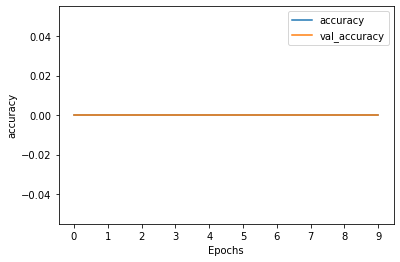

In [191]:
plot_graphs(model.history, 'accuracy')

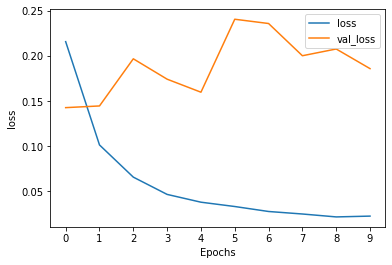

In [192]:
plot_graphs(model.history, 'loss')

7. The model starts to overfit after a couple of epochs. 
Consider using [early stopping](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping) to stop training when a monitored metric has stopped improving. 

  What can we do to tame overfitting?

    Collect more data to get more instances that we might not be seeing.

8. Print the classification report of the model on test dataset. 

In [199]:
print(classification_report((model.predict(X_test) > 0.5).astype("int32"), y_test))

250/250 [==============================] - 1s 4ms/step
              precision    recall  f1-score   support

           0       0.98      0.97      0.97      7492
           1       0.58      0.66      0.62       499

    accuracy                           0.95      7991
   macro avg       0.78      0.81      0.80      7991
weighted avg       0.95      0.95      0.95      7991



9. Discuss: how does the BiLSTM model improve the classification over naive Bayes? 

    It classifies hate speech more precisely and is in fact the best at recognizing non-hate speech. There is more improvement in precision for hate-speech.

In [ ]:
# # NB using tf-idf
#               precision    recall  f1-score   support

#            0       0.96      0.97      0.97      7430
#            1       0.55      0.48      0.51       561

#     accuracy                           0.94      7991
#    macro avg       0.75      0.72      0.74      7991
# weighted avg       0.93      0.94      0.93      7991

# # NB using word2vec
#               precision    recall  f1-score   support

#            0       0.98      0.85      0.91      7430
#            1       0.29      0.82      0.43       561

#     accuracy                           0.85      7991
#    macro avg       0.64      0.83      0.67      7991
# weighted avg       0.94      0.85      0.88      7991

10. Visualize embeddings using [Embedding Projector](https://www.tensorflow.org/tensorboard/tensorboard_projector_plugin) in Tensorboard. 
The setup for Tensorboard can be tricky, most of the code is provided. 

    TensorBoard reads tensors and metadata from the logs of your tensorflow projects. 
    The path to the log directory is specified with log_dir below. 
    
    In order to load the data into Tensorboard, we need to save a training checkpoint to that directory, along with metadata that allows for visualization of a specific layer of interest in the model.

    Load the TensorBoard notebook extension and import `projector` from `tensorboard.plugins`.

In [200]:
%load_ext tensorboard

In [201]:
from tensorboard.plugins import projector

11. Clear any logs from previous runs if any.

In [202]:
rm -rf /logs/  

12. Set up a logs directory, so Tensorboard knows where to look for data.

In [203]:
import os
log_dir='/logs/tweets-example/'
if not os.path.exists(log_dir):
    os.makedirs(log_dir)

13. Save the first `VOCAB_SIZE` most frequent words in the vocabulary as `metadata.tsv`.

In [204]:
with open(os.path.join(log_dir, 'metadata.tsv'), "w") as f:
  i = 0
  for label in tokenizer.word_index.keys():
    if label == 'oov':
      continue # skip oov
    f.write("{}\n".format(label))
    if i > VOCAB_SIZE:
      break
    i += 1

14. Save the weights we want to analyze as a variable. Note that the first value represents any unknown word, which is not in the metadata, here we will remove this value.

In [205]:
weights = tf.Variable(model.layers[0].get_weights()[0][1:]) # `embeddings` has a shape of (num_vocab, embedding_dim) 

15. Create a checkpoint from embedding, the filename and key are the name of the tensor.

In [206]:
checkpoint = tf.train.Checkpoint(embedding=weights)
checkpoint.save(os.path.join(log_dir, "embedding.ckpt"))

'/logs/tweets-example/embedding.ckpt-1'

16. Set up config.

In [207]:
config = projector.ProjectorConfig()
embedding = config.embeddings.add()

17. The name of the tensor will be suffixed by `/.ATTRIBUTES/VARIABLE_VALUE`.

In [208]:
embedding.tensor_name = "embedding/.ATTRIBUTES/VARIABLE_VALUE"
embedding.metadata_path = 'metadata.tsv'
projector.visualize_embeddings(log_dir, config)

18. Verify the following files exist under the current directory

In [209]:
ls /logs/tweets-example/

checkpoint                            metadata.tsv
embedding.ckpt-1.data-00000-of-00001  projector_config.pbtxt
embedding.ckpt-1.index


19. Now run Tensorboard against on log data we just saved. 

    You may need to run this cell **twice** to see the projector correctly. 
    Use Chrome for least friction.

In [211]:
%tensorboard --logdir /logs/tweets-example/

Reusing TensorBoard on port 6006 (pid 2696), started 0:00:17 ago. (Use '!kill 2696' to kill it.)

<IPython.core.display.Javascript object>

The TensorBoard Projector can be a great tool for interpreting and visualzing embedding. The dashboard allows users to search for specific terms, and highlights words that are adjacent to each other in the embedding (low-dimensional) space. Try a few word in the Search box and see if the embeddings make sense. 

# Task 6. Interpretation

Lastly let's try to understnad predictions by BiLSTM using a model agnostic approach -- [Local interpretable model-agnostic explanations (LIME)](https://christophm.github.io/interpretable-ml-book/lime.html)

1. Import `LimeTextExplainer` from the [`lime_text`](https://lime-ml.readthedocs.io/en/latest/lime.html#module-lime.lime_text) module in package [`lime`](https://github.com/marcotcr/lime)

In [212]:
from lime.lime_text import LimeTextExplainer

2. Create an instance of `LimeTextExplainer`, call it `explanier`. 

In [213]:
explainer = LimeTextExplainer(class_names=['no', 'yes'], random_state=2)

3. Method `explain_instance` expects the `classifier_fn` to be a function, we provide the function `predict_proba` as below. 

In [214]:
def predict_proba(arr):
    processed = tokenizer.texts_to_sequences(arr)
    processed = pad_sequences(processed, padding='post', maxlen=MAX_LEN)
    pred = model.predict(processed)
    r = []
    for i in pred:
        temp = i[0]
        r.append(np.array([1-temp,temp])) 
    return np.array(r)

4. Read about [`explain_instance`](https://lime-ml.readthedocs.io/en/latest/lime.html#lime.lime_text.LimeTextExplainer.explain_instance). 

    Create an instance named `exp` to explain the 16399th tidy tweet from the original dataset, i.e., `raw.tidy_tweet.iloc[16399]`. 

In [221]:
idx = 16399 
exp = explainer.explain_instance(
    text_instance=raw.tidy_tweet.iloc[idx],
    classifier_fn=predict_proba,
    num_features=6)
exp.show_in_notebook(text=raw.tidy_tweet.iloc[idx])

157/157 [==============================] - 1s 4ms/step


5. Pick another random tweet and generate explanations for the prediction.

In [222]:
idx = 13453 
exp = explainer.explain_instance(
    text_instance=raw.tidy_tweet.iloc[idx],
    classifier_fn=predict_proba,
    num_features=6)
exp.show_in_notebook(text=raw.tidy_tweet.iloc[idx])

157/157 [==============================] - 0s 3ms/step


6. Jot down your observations in explaining the model. 

    Words such as 'racist' contribute to hate-speech classification the most but we also see that some political figures contribute to hate speech too such as 'Obama'. For non-hate speech, we see more positive words such as 'happiness' and 'right mindset'.

# Acknowledgement & Reference

- Data is adapted from [Twitter sentiment analysis](https://datahack.analyticsvidhya.com/contest/practice-problem-twitter-sentiment-analysis/#ProblemStatement)
- [Twitter sentiment analysis](https://github.com/prateekjoshi565/twitter_sentiment_analysis/blob/master/code_sentiment_analysis.ipynb) 
- [Introduction to Word Embedding and Word2Vec](https://towardsdatascience.com/introduction-to-word-embedding-and-word2vec-652d0c2060fa)
- [When to use GRU over LSTM?](https://datascience.stackexchange.com/questions/14581/when-to-use-gru-over-lstm)
- Use a trained Word2Vec, Doc2Vec or FastTest embedding by `gensim` in buiding an embedding layers in Tensorflow, here's [how-to](https://github.com/RaRe-Technologies/gensim/wiki/Using-Gensim-Embeddings-with-Keras-and-Tensorflow).